# <span style="color:blue"> Computer Vision — Spring 2026

## Exercise 2

**Deadline:** May 6, 17:00. \
If you need more time, please send a private Piazza message letting me know that you'll submit late. An extension of up to 1 week is automatically approved.

---

In this exercise, you will implement:

1. Straight line detection from image features using Hough Transform.
2. Various feature matching.
3. Computing depth from rectified images.

## Submission guidelines

1. Your submission should include the following files:
   - `hw2_<ID>_<ID>.ipynb` \
     Replace \<ID\> with your ID number(s).
3. Use Jupyter Notebook.
4. Submit this assignment in pairs (no triplets, singles ok).
   * One student should submit the homework, and the other should not submit anything.
   * If you are not the one submitting, make sure that your collaborator indeed submits!
5. **Check that your solution is properly displayed in the last cell!**

## Read the following instructions carefully

1. Write **efficient vectorized** code.
2. You are responsible for the correctness of your code and should add as many tests as you see fit.
3. Use `Python 3` and `NumPy 1.3.2` or above. Before submitting the exercise, restart the kernel and run the notebook from start to finish to make sure everything works.
4. You are allowed to use functions and methods from the [Python Standard Library](https://docs.python.org/3/library/) and [NumPy](https://www.numpy.org/devdocs/reference/) only. Any other imports are forbidden unless provided by us.
5. Your code must run without errors. **Code that fails to run will not be graded.**
6. Document your code properly.

## Honor Code
The assignment is a basic tool for learning the material. You can probably find the solution on the web, but then you will not learn anything from it.
You are more than welcome to discuss the assignment with your friends, but you are not allowed to give your code or answers and you are not allowed to use their code or answers.
Feel free to use AI, but you are expected to understand every piece of code that you submit. Please re-read the course's AI policy.
Remember — you take this course in order to learn. Also, the final exam will contain a lot of material from the assignments. 😀

### I declair that I respcet the honor code, and that I understand the course's plagiarism policy and AI policy.
<span style="color:red"> Shay Tanne

In [17]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.linalg import null_space

%matplotlib inline
plt.rcParams['figure.figsize'] = (8.0, 8.0) # set default size of plots
plt.rcParams['image.cmap'] = 'gray'

import platform
print("Python version: ", platform.python_version())
print("Numpy version: ", np.__version__)

Python version:  3.11.15
Numpy version:  2.4.4


In [18]:
from pathlib import Path

# All images live in the images/ subfolder
example_image_path = Path("images/Sudoku.PNG")
example_img = cv2.imread(str(example_image_path), cv2.IMREAD_GRAYSCALE)

if example_img is None:
    print(f"Could not load image: {example_image_path}")
else:
    print(f"Loaded image: {example_image_path}, shape={example_img.shape}")

# Available images:
#   images/Sudoku.PNG, images/Crosswalk.jpg, images/linesOnTheRoadGray.jpg
#   images/view0.tif, images/view6.tif, images/view1.tif, images/view5.tif

Loaded image: images\Sudoku.PNG, shape=(1053, 1053)


## <span style="color:blue">Section A: Detect Straight Lines </span>

In this part you will use the set of edge points to detect straight lines in an image.\
The input will consist of edge points computed by the Canny edge detector - you can use the implementation of CV2, which is demonstrated below.\
The output will be a set of straight lines in the image. There are two main methods to compute straight lines from such input: the Hough transform and RANSAC. You will implement the Hough transform.

**Hough transform**\
Every 2D line, $\ell$, can be represented by 2 parameters: $r$ and $\theta$ where all points on the line satisfy $r= x\cos\theta + y\sin\theta$.
Let $P_0=(x_0,y_0)$ be the intersection of a normal to $\ell$ from the origin.
The distance between $P_0$ and the origin is given by $r$ and the angle between the normal and the $x$ axis is given by $\theta$.



**Your goal:**     Write the following function\
`straight_lines(image_file, resolution_r, resolution_ang, min_num_points, display, ...)`\
You may add other parameters; make sure to give them default values.
    


To do so, you need to also define the following functions. 
You may add parameters to the functions, as long as you provide clear explanations of their purpose.

In [19]:
# Input: a set of edge points (or corners), and the resolution of the distance and angles.
# Output: the Hough matrix (H) containing votes for lines represented by r and theta.

def H_matrix(L_points: np.ndarray, resolution_r: int, resolution_ang: int, img_shape: tuple[int, int]) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Computes H matrix
    - maps r,theta values to bins according to the specified resolutions
    - accumulates votes for each (r,theta) bin based on the input edge points
    :param L_points: num_pointsX2 array with (x, y) coords of edge points, shape: [num_points, 2]
    :param img_shape: image's (height, width)
    :return H: Hough matrix, shape: [num_r_bins, num_theta_bins]
    :return theta: array of theta "ticks", shape: [num_theta_bins]
    :return r_bin_center_vals: array of r "ticks", shape: [num_r_bins]
    """
    
    # discrete theta values
    theta = np.arange(0, 180, resolution_ang)
    theta_rad = np.deg2rad(theta)

    # calculate normal unit vectors for each line/angle 
    unit_normal = np.vstack((np.cos(theta_rad), np.sin(theta_rad)))  # shape: [2, num_angles]

    # calculate r for each (point,theta) combination
    r = L_points @ unit_normal # shape: [num_points, num_angles]

    # shift r values to avoid negative r-idxs
    img_h, img_w = img_shape
    r_max = np.ceil(np.sqrt(img_h**2 + img_w**2)) # upper bound for r
    r_positive = r + r_max                        # shift

    # find # of bins for r,theta -> dimensions of H matrix
    num_r_bins = int(np.round(2 * r_max / resolution_r)) + 1
    num_theta_bins = len(theta)

    # discretize r
    r_bin_idxs = np.round(r_positive / resolution_r).astype(int)     # scale r according to reqd resolution, round to nearest int
    r_bin_idxs = np.clip(r_bin_idxs, a_min=0, a_max=(num_r_bins-1))  # clip to valid range of r-idxs

    # broadcast theta to fit r_bin_idxs shape 
    theta_bin_idxs = np.broadcast_to(np.arange(num_theta_bins), r_bin_idxs.shape)  # shape: [num_points, num_angles]
    
    # accumulate votes in H matrix
    H = np.zeros((num_r_bins, num_theta_bins), dtype=int)   # shape: [num_r_bins, num_theta_bins]
    np.add.at(H, (r_bin_idxs, theta_bin_idxs), 1)

    # H histogram r-axis ticks (theta-axis ticks are original theta array)
    r_bin_center_vals = (np.arange(num_r_bins) * resolution_r) - r_max

    return H, theta, r_bin_center_vals


# Input: The Hough matrix H, and a threshold for the minimal number of points on the line.
# Output: a list of triplets (r, theta, num_points) where
# num_points is the number of points on that line.

def list_lines(H: np.ndarray, min_num_points: int, theta_ticks: np.ndarray, r_ticks: np.ndarray, nms_neighb_size: int = 5) -> list:
    """
    Extracts the local maxima from the Hough matrix.
    :param H: H matrix
    :param min_num_points: minimum threshold for votes to consider a line valid
    :param theta_ticks: set of angle bin values
    :param r_ticks: set of r bin values
    :return: list of (r, theta, num_points) tuples | num_points = # of points on the line (r, theta)
    """
    
    # find coords where element exceeds vote threshold
    row_idxs, col_idxs = np.where(H >= min_num_points)  
    votes = H[row_idxs, col_idxs]                 # collect those elements
    votes_sorted_idxs = np.argsort(votes)[::-1]   # sort in descending order
    row_idxs = row_idxs[votes_sorted_idxs]        
    col_idxs = col_idxs[votes_sorted_idxs]
    votes = votes[votes_sorted_idxs]    
    
    # boolean mask to track which bins were zeroed out by a higher neighboring vote
    suppressed = np.zeros_like(H, dtype=bool)
    
    # neighborhood size
    offset = nms_neighb_size // 2
    num_rows, num_cols = H.shape
    
    # greedy non-max Suppression:
    lines = []
    for row, col, vote in zip(row_idxs, col_idxs, votes):
        if suppressed[row, col]:
            continue  # skip if bin already suppressed by stronger one
            
        # not suppressed: bin is valid local peak -> map to physical values
        lines.append((r_ticks[row], theta_ticks[col], vote))
        
        # suppress bin's local neighborhood
        r_min, r_max = np.clip([(row - offset), (row + offset + 1)], a_min=0, a_max=num_rows)
        c_min, c_max = np.clip([(col - offset), (col + offset + 1)], a_min=0, a_max=num_cols)

        # update mask to suppress this neighborhood
        suppressed[r_min:r_max, c_min:c_max] = True
        
    return lines


# Display the detected lines in red - overlaid on the original image
def display_lines(im: np.ndarray | None, lines: list) -> np.ndarray:
    """
    Overlays detected lines over original image
    :param im: original image (grayscale)
    :param lines: list of (r, theta, num_points) tuples
    :return: image annotated with detected lines
    """

    # create a color copy to draw red lines on
    if len(im.shape) == 2:
        output_img = cv2.cvtColor(im, cv2.COLOR_GRAY2RGB)
    else:
        output_img = im.copy()
        
    # stretch factor (larger than image diagonal)
    img_h, img_w = im.shape[:2]
    stretch = int(np.ceil(np.sqrt(img_h**2 + img_w**2))) 
    
    # draw each line - find 2 points along the line, connect them with cv2.line
    for r, theta, votes in lines:
        theta_rad = np.deg2rad(theta)
        
        # anchor point
        anchor_x = np.cos(theta_rad)
        anchor_y = np.sin(theta_rad)
        x0 = anchor_x * r
        y0 = anchor_y * r
        
        # stretch in both directions along the perpendicular
        x1 = int(x0 + stretch * (-anchor_y))
        y1 = int(y0 + stretch * (anchor_x))
        x2 = int(x0 - stretch * (-anchor_y))
        y2 = int(y0 - stretch * (anchor_x))
        
        # draw
        cv2.line(output_img, pt1=(x1, y1), pt2=(x2, y2), color=(255, 0, 0), thickness=2)

    return output_img
    

In [20]:
def plot_hough_lines_procedure(img: np.ndarray, edges: np.ndarray, annotated_img: np.ndarray, num_lines: int, image_name: str) -> None:
    """
    Helper function to display Hough lines process
    - original image
    - Canny edges
    - detected lines overlaid over image
    """
    plt.rcParams['figure.figsize'] = (15.0, 5.0)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3)
    plt.suptitle(f"Hough Transform Line Detection - {image_name}", fontsize=16)
    
    ax1.imshow(img, cmap='gray')
    ax1.set_title('Original Image')
    ax1.axis('off')
    
    ax2.imshow(edges, cmap='gray')
    ax2.set_title('Edges (Canny)')
    ax2.axis('off')
    
    ax3.imshow(annotated_img)
    ax3.set_title(f'Detected Lines (Count: {num_lines})')
    ax3.axis('off')
    
    plt.show()


# Now use the above functions to implement
def straight_lines(image_file: str | Path, resolution_r: int = 1, resolution_ang: int = 1, min_num_points: int = 50, display: bool = False, canny_th1=250, canny_th2=500, canny_aperture=3, nms_neighb_size=5) -> tuple[list, np.ndarray]:
    """
    Detects straight lines in an image using Hough Transform
    """
    # load image
    img = cv2.imread(str(image_file), cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f"Could not load image: {image_file}")
        
    # extract edges using Canny
    edges = cv2.Canny(img, threshold1=canny_th1, threshold2=canny_th2, apertureSize=canny_aperture)
    
    # extract edge point coords
    y_idxs, x_idxs = np.where(edges > 0)
    edge_points = np.column_stack((x_idxs, y_idxs))
    
    # compute H matrix
    H, theta, r_ticks = H_matrix(
        L_points=edge_points, 
        resolution_r=resolution_r, 
        resolution_ang=resolution_ang, 
        img_shape=img.shape
    )  

    # extract lines from H matrix
    lines = list_lines(
        H=H, 
        min_num_points=min_num_points, 
        theta_ticks=theta, 
        r_ticks=r_ticks,
        nms_neighb_size=nms_neighb_size
    )                             
    annotated_img = display_lines(im=img, lines=lines)

    if display:
        img_name = Path(image_file).name
        plot_hough_lines_procedure(img=img, edges=edges, annotated_img=annotated_img, num_lines=len(lines), image_name=img_name)
        
    return lines, annotated_img

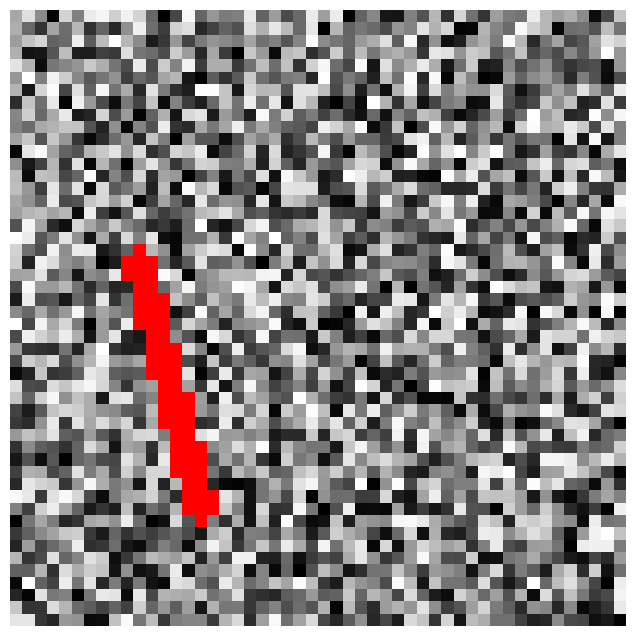

In [21]:
# Here is an example of how to draw a red line
# between (x1, y1) and (x2, y2) on a gray level image, img
# The first step is to create a color image from img.

img = np.random.randint(0, 256, size=(50, 50), dtype=np.uint8)
x1, y1 = 10, 20
x2, y2 = 15, 40
thickness = 2

color_image = np.dstack([img, img, img])
cv2.line(color_image, (x1, y1), (x2, y2), (255, 0, 0), thickness)

plt.imshow(color_image)
plt.axis('off')
plt.show()

(<matplotlib.image.AxesImage at 0x236e062e110>, Text(0.5, 1.0, 'Edge Image'))

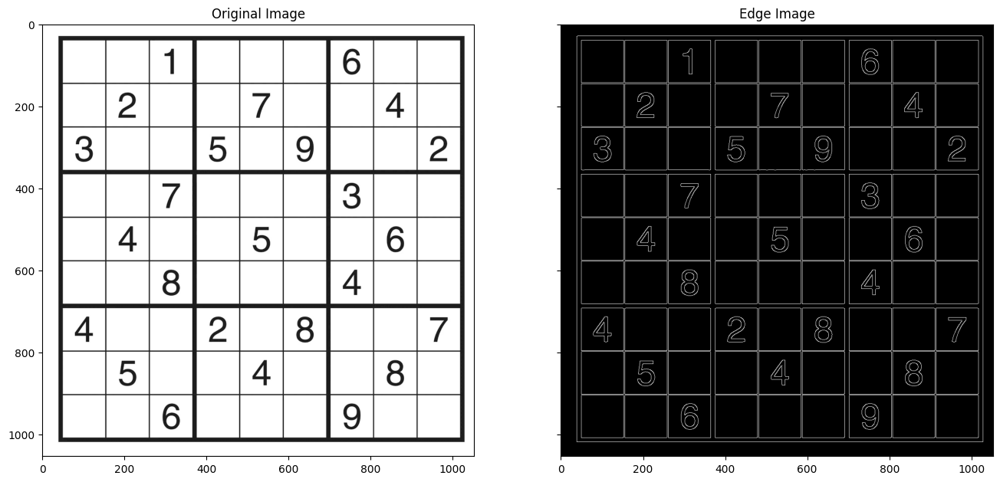

In [22]:
# Here is an example of how to use the CV2 Canny edge detector.
# You can play with the parameters to achieve desired results.

img = cv2.imread(str(Path("images/Sudoku.PNG")), cv2.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"

edges = cv2.Canny(img, 250, 500, 5)

plt.rcParams['figure.figsize'] = (16.0, 16.0)
f, (ax1, ax2) = plt.subplots(1, 2, sharex='col', sharey='row')

ax1.imshow(img), ax1.set_title('Original Image')
ax2.imshow(edges), ax2.set_title('Edge Image')


**Apply and answer**

1. Generate a synthetic image to test your Hough Transform algorithm. \
   Submit the image as well as the results.

2. Apply your algorithm to the following images: Crosswalk, linesOnTheRoadGray, Sudoku. \
   Choose an appropriate set of parameters; you might need different parameters for each image. Don't forget to display the results.
   
3. **Answer**: How the resolutions of $r$ and $\theta$ affect the results? Display images that demonstarte your answer.
   
4. Choose one image and **answer**: how many straight lines did you find with more than 50 points? Display these lines on the image.
   
5. Suggest an algorithm to compute the length of lines in the image. Describe the algorithm without implementing it.
   
6. Suggest three applications that use the results of straight line detection in an image.


#### Task A1 - Synthetic Image

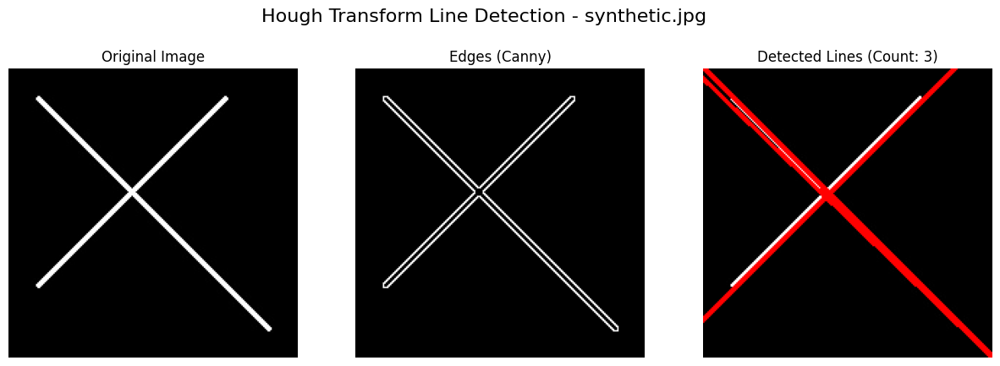

In [23]:
synthetic_img = np.zeros((200, 200), dtype=np.uint8)
cv2.line(synthetic_img, pt1=(20, 20), pt2=(180, 180), color=255, thickness=2)
cv2.line(synthetic_img, pt1=(20, 150), pt2=(150, 20), color=255, thickness=2)
cv2.imwrite('images/synthetic.jpg', synthetic_img)

lines_synth, lines_on_synthetic_overlay = straight_lines(
    image_file=Path('images/synthetic.jpg'), 
    resolution_r=1,
    resolution_ang=1,
    min_num_points=80,
    nms_neighb_size=9,
    display=True
)

#### Task A2 - Real Images

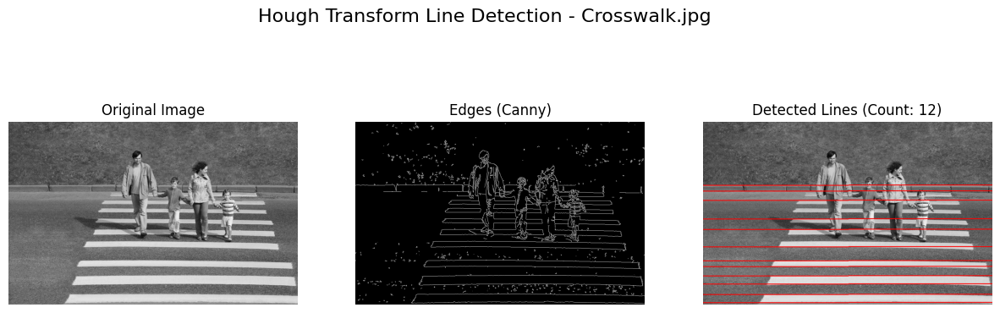

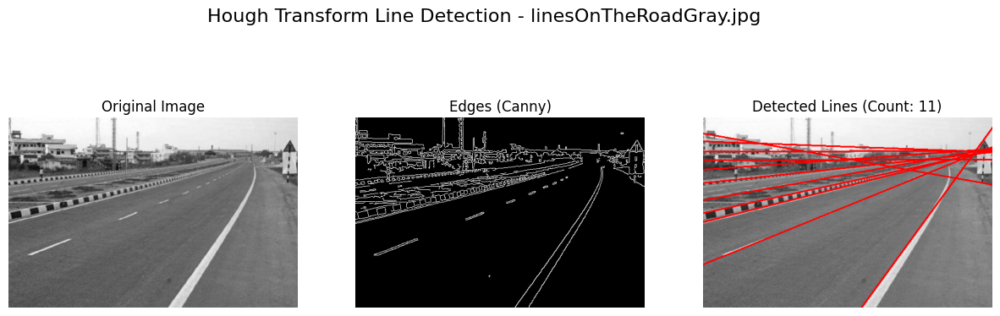

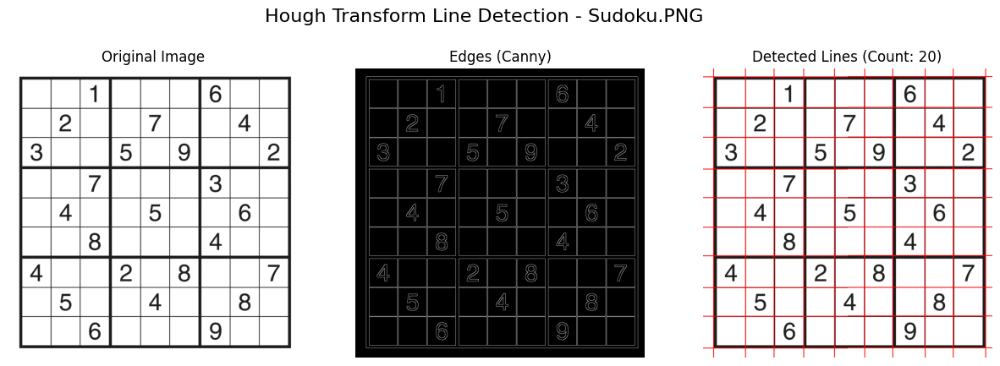

In [24]:
lines_crosswalk, lines_on_crosswalk_overlay = straight_lines(
    image_file=Path("images/Crosswalk.jpg"), 
    resolution_r=2, 
    resolution_ang=2, 
    min_num_points=300, 
    canny_th1=150, # higher canny thresholds to reduce noise from asphalt textures
    canny_th2=300, 
    canny_aperture=3, 
    nms_neighb_size=15,
    display=True
)

lines_road, lines_on_road_overlay = straight_lines(
    image_file=Path("images/linesOnTheRoadGray.jpg"), 
    resolution_r=2, 
    resolution_ang=2, 
    min_num_points=200, 
    canny_th1=100, 
    canny_th2=200, 
    canny_aperture=3, 
    nms_neighb_size=15,
    display=True
)

lines_sudoku, lines_on_sudoku_overlay = straight_lines(
    image_file=Path("images/Sudoku.PNG"), 
    resolution_r=2, 
    resolution_ang=2, 
    min_num_points=250, 
    nms_neighb_size=15,
    canny_th1=100,
    canny_th2=200,
    display=True
)

#### Task A3 - Effect of Resolution Parameters

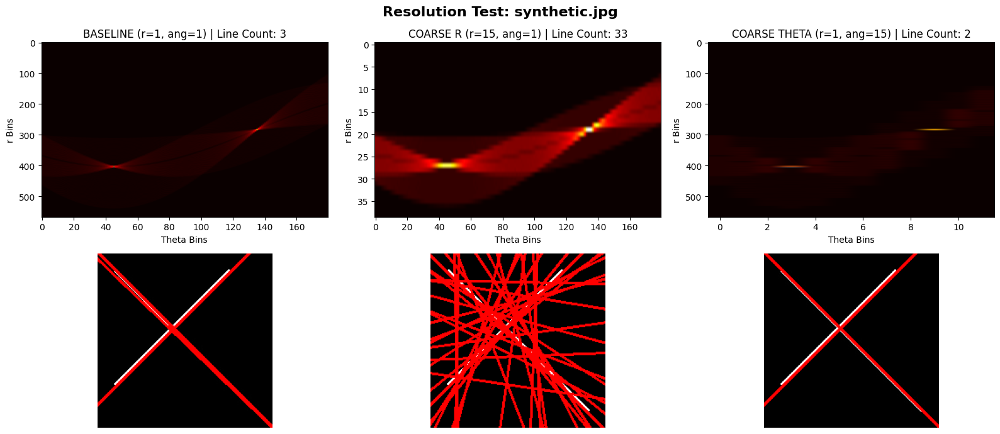

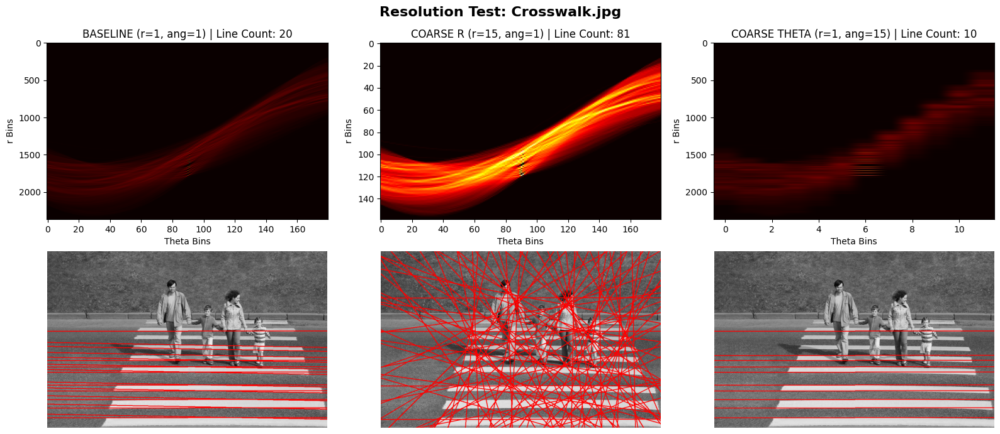

In [25]:
# images + neutral parameters to isolate resolution effect
test_images = [
    {"path": "images/synthetic.jpg", "t1": 100, "t2": 200, "vote_threshold": 80, "nms": 11},
    {"path": "images/Crosswalk.jpg", "t1": 250, "t2": 500, "vote_threshold": 150, "nms": 15},
]

# configs
resolution_tests = [
    {"r": 1, "ang": 1, "title": "BASELINE (r=1, ang=1)"},
    {"r": 15, "ang": 1, "title": "COARSE R (r=15, ang=1)"},
    {"r": 1, "ang": 15, "title": "COARSE THETA (r=1, ang=15)"}
]

for img_dict in test_images:

    # load image
    img_path = Path(img_dict["path"])
    if not img_path.exists():
        print(f"Skipping {img_path.name} - File not found.")
        continue
    img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
        
    # extract edge points
    edges = cv2.Canny(img, threshold1=img_dict["t1"], threshold2=img_dict["t2"], apertureSize=3)
    y_idxs, x_idxs = np.where(edges > 0)
    L_points = np.column_stack((x_idxs, y_idxs))
    
    # grid for image visuals
    fig, axes = plt.subplots(2, 3, figsize=(16, 7))
    fig.suptitle(f"Resolution Test: {img_path.name}", fontsize=16, fontweight='bold', y=0.98)
    
    for idx1, res_dict in enumerate(resolution_tests):
        res_r = res_dict["r"]
        res_ang = res_dict["ang"]
        config_name = res_dict["title"]
        
        # computte H matrix
        H, theta, r_vals = H_matrix(
            L_points=L_points, 
            resolution_r=res_r, 
            resolution_ang=res_ang, 
            img_shape=img.shape
        )
        
        # detect + draw lines
        lines = list_lines(
            H=H, 
            min_num_points=img_dict["vote_threshold"], 
            theta_ticks=theta, 
            r_ticks=r_vals, 
            nms_neighb_size=img_dict["nms"]
        )
        annotated_img = display_lines(im=img, lines=lines)
        
        # top row: H matrix
        ax_h = axes[0, idx1]
        ax_h.imshow(H, cmap='hot', aspect='auto')
        ax_h.set_title(f"{config_name} | Line Count: {len(lines)}", fontsize=12)
        ax_h.set_xlabel("Theta Bins"); ax_h.set_ylabel("r Bins")
        
        # bottom row: final image
        ax_img = axes[1, idx1]
        ax_img.imshow(annotated_img)
        ax_img.axis('off')

    plt.tight_layout()
    plt.show()

#### Task A3 - Effect of Resolution Parameters

##### Observations:
The resolutions of r and theta dictate the size of the Hough bins, controlling tolerance for 
variations in position and angle.

Fine resolution on both:
* requires points to fall within a very narrow/limited "strip" of lines
* can distinguish closely spaced lines if they are well defined
* struggles with thick or noisy lines (see double-detetions in crosswalk image) -> votes from single thick edge fall into multiple adjacent bins, leading to: 
    - multiple detections of same real edge
    - missed detections if bins fall short of vote threshold

Coarse r resolution:
* reduces line position strictness - edge points falling on parallel lines within the broader range of r are grouped
* groups distant, unrelated pixels into the same bin because they share an angle -> creates FP lines
* makes TP physically shift away from their real edges

Coarse theta resolution: 
* reduces angle strictness - points sitting on lines with similar but not identical angles are grouped
* better with thick edges nd noisy lines - groups votes scattered onto deifferent angles close enough in same bin (fixes the double-detection issue in crosswalk image)
* can make TP detections change their angle a bit from the real edge angle


#### Task A4 - Low Vote Threshold (on crowsswalk image)
Number of lines detected in image `Crosswalk.jpg` with at least 50 points: 290

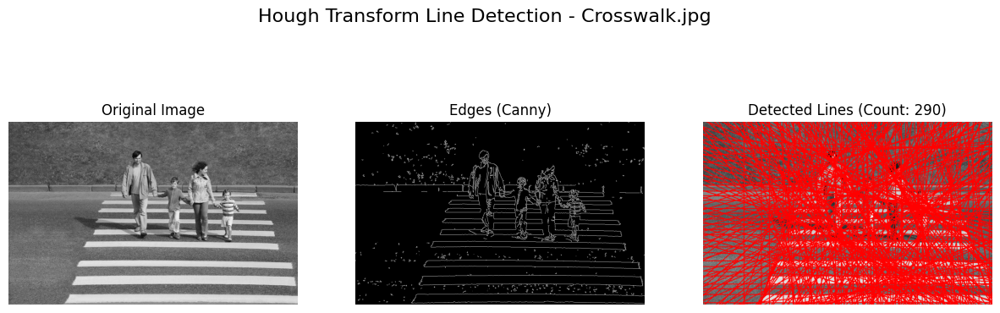

Number of straight lines found with >50 points in Crosswalk: 290


In [26]:
lines_low_vote_threshold, lines_low_vote_threshold_overlay = straight_lines(
    image_file=Path("images/Crosswalk.jpg"), 
    resolution_r=2, 
    resolution_ang=2, 
    min_num_points=50, 
    canny_th1=150,
    canny_th2=300, 
    canny_aperture=3, 
    nms_neighb_size=15,
    display=True
)

print(f"Number of straight lines found with >50 points in Crosswalk: {len(lines_low_vote_threshold)}")  

#### Task A5 - Line Length Algorithm
1. For each detected line defined by $(r, \theta)$:
    1. Get the Canny edge points that fall on that line (filter from the `L_points` array).
    2. Find vector in direction of the line - the normal vector is $\langle cos(\theta),sin(\theta)\rangle$ so a $90\degree$ rotation is a vector in the direction of the line: $\langle -sin(\theta),cos(\theta)\rangle$.
    3. Project each edge (2D) point onto the line - dot product of point's $\langle x,y\rangle$ and the line direction vector.
    4. Sort the points by their 1D coord on the line.
    5. Pick an upper threshold for the difference 2 points can have and still be part of the same line segment; cluster the points using this threshold (when the gap is too big start a new cluster)
    6. Measure line (segment) length - each segment's length is the difference bettween the 1D coord of its first and last point.

#### Task A6 - Line Detection Applications
1. Autonomous vehicle lane detection (when I worked at GM it was mostly done with deep CV, but Hough is useful for validation and visualization).
2. Sports analytics/boradcasting - detecting court boundaries/markings (augmenting game broadcast or calibrating camera tracking)
3. Image editing - finding important lines like the horizon (e.g. image leveling) or cropping important parts (e.g. document scanning)


In [27]:
# Section A - Apply and answer (student code)

# A4
num_lines_vote_threshold_50 = len(lines_low_vote_threshold)

# A3
resolution_effect = """
The resolutions of r and theta dictate the size of the Hough bins, controlling tolerance for 
variations in position and angle.\n\n

Fine resolution on both:\n
- requires points to fall within a very narrow/limited "strip" of lines\n
- can distinguish closely spaced lines if they are well defined\n
- struggles with thick or noisy lines (see double-detetions in crosswalk image) -> votes from 
single thick edge fall into multiple adjacent bins, leading to: a) multiple detections of same 
real edge and b) missed detections if bins fall short of vote threshold\n\n

Coarse r resolution:\n
- reduces line position strictness - edge points falling on parallel lines within the broader range of r are grouped\n
- groups distant, unrelated pixels into the same bin because they share an angle -> creates FP lines\n
- makes TP physically shift away from their real edges\n\n

Coarse theta resolution:\n
* reduces angle strictness - points sitting on lines with similar but not identical angles are grouped\n
* better with thick edges nd noisy lines - groups votes scattered onto deifferent angles close enough in 
same bin (fixes the double-detection issue in crosswalk image)\n
* can make TP detections change their angle a bit from the real edge angle\n
"""

# A5
line_length_algorithm = """
1. For each detected line defined by (r, theta):\n
1.1 Get the Canny edge points that fall on that line (filter from the L_points array).\n
1.2 Find vector in direction of the line - the normal vector is [cos(theta),sin(theta)] so a 90 degree rotation is a vector in the direction of the line: [-sin(theta),cos(theta)].\n
1.3 Project each edge (2D) point onto the line - dot product of point's [x,y] and the line direction vector.\n
1.4 Sort the points by their 1D coord on the line.\n
1.5 Pick an upper threshold for the difference 2 points can have and still be part of the same line segment; cluster the points using this threshold (when the gap is too big start a new cluster).\n
1.6 Measure line (segment) length - each segment's length is the difference bettween the 1D coord of its first and last point.\n
"""

# A6
line_detection_applications = [
    "Autonomous vehicle lane detection (when I worked at GM it was mostly done with deep CV, but Hough is useful for validation and visualization)",
    "Sports analytics/boradcasting - detecting court boundaries/markings (augmenting game broadcast or calibrating camera tracking)", 
    "Image editing - finding important lines like the horizon (e.g. image leveling) or cropping important parts (e.g. document scanning)"
]

## <span style="color:blue">Section B: Patch Matching </span>
**In this part you will match interest points across two images.**

There are two functions between vectors $v$ and $u$ that you will consider:\
a. Distance: Sum of Square Distance (SSD). That is,  $SSD(u,v)=(u-v)\cdot(u-v)$.\
b. Similarity: Normalized Cross Correlation (NCC). That is,  $NCC(u,v)={u\cdot v \over ||u||||v||}$.

The patch descriptor:
1. A vector with the pixels' grey level.
2. A histogram (30 bins) of the pixels' grey level.
3. A vector with the pixels' gradient strength.
4. A histogram (30 bins) of the pixels' gradient strength.

In [28]:
# Implement the following functions:

# Input: two MATRICES (vecorized version) - sets of patch descriptors
# Output: matrix of distances (scalars) between two patches
def SSD(U: np.ndarray, V: np.ndarray) -> np.ndarray:
    """
    Sum of Square Distance between 2 sets of patch descriptors (vectors)
    - computes distance between each pair of descriptors from the 2 sets
    - formula: (u-v)^2 = u^2 + v^2 - 2uv
    :param U: (N1, D) matrix of pathc descriptors (rows)
    :param V: (D, N2) matrix of patch descriptors (columns)
    :return: (N1, N2) matrix of squared distances
    """

    U_sqr = np.sum(U**2, axis=1, keepdims=True)  # u^2 , shape [N1,1]
    V_sqr = np.sum(V**2, axis=0, keepdims=True)  # v^2 , shape [1,N2]
    UV = U @ V                                 # uv , shape [N1,N2]
    
    ssd = U_sqr + V_sqr - 2 * UV   # (u-v)^2 = u^2 + v^2 - 2uv
    return np.clip(ssd, a_min=0, a_max=None)       # avoid negative distances


# Input: two MATRICES (vecorized version) - sets of patch descriptors
# Output: normalized cross correlation (scalar) between two patches
def NCC(U: np.ndarray, V: np.ndarray) -> np.ndarray:
    """
    Normalized Cross-Correlation between 2 sets of patch descriptors (vectors)
    :param U: (N1, D) matrix of patch descriptors (rows)
    :param V: (D, N2) matrix of patch descriptors (columns)
    :return: (N1, N2) matrix of correlation scores , range [-1, 1]
    """
    
    # force descriptor mean to 0    
    U_centered = U - np.mean(U, axis=1, keepdims=True)   # by rows
    V_centered = V - np.mean(V, axis=0, keepdims=True)   # by cols

    # normalize to unit length (L2 norm)
    eps = 1e-10 # small const to avoid 0-division
    U_lengths = np.linalg.norm(U_centered, axis=1, keepdims=True) + eps  # by rows, shape [N1, 1]
    V_lengths = np.linalg.norm(V_centered, axis=0, keepdims=True) + eps  # by cols, shape [1, N2]
    U_normed = U_centered / U_lengths
    V_normed = V_centered / V_lengths
    
    # compute correlation for all (U,V) pairs
    ncc = U_normed @ V_normed  # (U / ||U||)x(V / ||V||), shape [N1, N2]
    return ncc


#  -------- Helper function(s) --------
def get_patch(img: np.ndarray, patch_center: np.ndarray, size: int) -> np.ndarray | None:
    """
    Helper to extract a patch centered at p = [x, y] 
    * verifies patch fits within image boundaries
    """
    x, y = int(patch_center[0]), int(patch_center[1])
    radius = size // 2

    # boundary check
    if ((y-radius) < 0) or ((y+radius+1) > img.shape[0]) or (x-radius < 0) or (x+radius+1 > img.shape[1]):
        return None
    
    return img[(y-radius):(y+radius+1), (x-radius):(x+radius+1)]


# For the following, im is an image, p is a pixel location, size is the patch size.
# Output: a descriptor vector
# You can use the histogram function of open cv or numpy

def patch_from_im(im: np.ndarray, p: np.ndarray, size: int) -> np.ndarray | None:
    """
    Raw pixel intensity descriptor
    :param im: input image
    :param p: pixel location [x, y]
    :param size: patch size (odd integer)
    :return: flattened patch vector, shape [D]
    **same params in following methods
    """
    patch = get_patch(
        img=im, 
        patch_center=p, 
        size=size
    )
    if patch is None: return None

    return patch.flatten().astype(np.float32)


def hist_patch_im(im: np.ndarray, p: np.ndarray, size: int) -> np.ndarray | None:
    """
    Grayscale histogram descriptor
    :return: histogram vector, shape [num_bins]
    """
    patch = get_patch(
        img=im, 
        patch_center=p, 
        size=size
    )
    if patch is None: return None
    
    # compute histogram, 30 bins over range [0, 255]
    num_bins = 30   
    hist, _ = np.histogram(patch, bins=num_bins, range=(0, 255))
    return hist.astype(np.float32)


def gradient(im: np.ndarray, p: np.ndarray, size: int) -> np.ndarray | None :
    """Gradient magnitude descriptor"""
    patch = get_patch(
        img=im, 
        patch_center=p, 
        size=size
    )
    if patch is None: return None
    
    patch_float = patch.astype(np.float32)  # convert patch to float for calculation
    gy, gx = np.gradient(patch_float)       # compute gradients
    
    # calculate magnitudes, flatten
    mag = np.sqrt(gx**2 + gy**2)
    return mag.flatten()


def hist_gradient(im: np.ndarray, p: np.ndarray, size: int) -> np.ndarray | None:
    """Histogram of gradient magnitudes (30 bins)"""
    mag_vec = gradient(im, p, size)
    if mag_vec is None: return None
    
    # compute magnitude histogram
    num_bins = 30
    hist, _ = np.histogram(mag_vec, bins=num_bins)
    return hist.astype(np.float32)

In [29]:
""" ------------- Matching Experiment Infrastructure ------------- """

def get_corner_descriptors_and_coords(img: np.ndarray, size: int, max_corners=2000, descriptor_func=patch_from_im) -> tuple[np.ndarray, np.ndarray]:
    """
    Extracts corner descriptors + their coords from an image

    :param img: input image
    :param size: size of descriptor patch
    :param max_corners: max # of corners to detect
    :param descriptor_func: function to extract descriptors
    :return: array of descriptors
    :return: array of coordinates
    """

    # detect corners
    corners = cv2.goodFeaturesToTrack(
        image=img, 
        maxCorners=max_corners, 
        qualityLevel=0.01, 
        minDistance=10
    )
    
    descriptors = []
    coords = []
    if corners is not None:

        # extract descriptors for each corner
        for corner in corners:
            p = corner.ravel() # [x, y]
            descriptor = descriptor_func(im=img, p=p, size=size)
            
            # save descriptor + coords ff corner is not too close to image boundary 
            if descriptor is not None: 
                descriptors.append(descriptor)      
                coords.append(p)
                
    return np.array(descriptors), np.array(coords)


def find_matches(m1: np.ndarray, m2: np.ndarray, coords1: np.ndarray, coords2: np.ndarray, feature_comparison_func: str = 'SSD', 
                 ratio_threshold: float = None, y_threshold: float = None) -> list[tuple[int, int]]:
    """
    Finds matches between two sets of descriptors
    :param m1: descriptors from image 1, shape [N1, D]
    :param m2: descriptors from image 2, shape [N2, D]
    :param coords1: coordinates of image 1 descriptors, shape [N1, 2]
    :param coords2: coordinates of image 2 descriptors, shape [N2, 2]
    :param feature_comparison_func: 'SSD' or 'NCC'
    :param ratio_threshold: ratio threshold
    :param y_threshold: Y-coordinate filtering threshold
    :return: list of matched indices
    """
    
    # transpose for matrix multiplication
    m2T = m2.T  
    
    # compute similarity matrix, shape [N1, N2]
    if feature_comparison_func == 'SSD':
        feature_dist = SSD(U=m1, V=m2T)
    elif feature_comparison_func == 'NCC':
        feature_dist = 1 - NCC(U=m1, V=m2T)  # convert NCC to "distance" (1 - NCC)
    else:
        raise ValueError("Invalid method, only 'SSD' or 'NCC' are supported")

    # experiment 2B) filter by Y-coord
    if y_threshold is not None:
        # calculate abs difference between all pairs of y-coords
        y_diffs = np.abs(coords1[:, 1, np.newaxis] - coords2[:, 1]) # shape [N1, N2]
        feature_dist[y_diffs > y_threshold] = np.inf

    # experiment 2C) best:second-best ratio:
    # find idxs of best 2 matches by feature "distance"
    sorted_idxs = np.argsort(feature_dist, axis=1)
    best_idxs = sorted_idxs[:, 0]
    second_best_idxs = sorted_idxs[:, 1]

    # get actual distances for ratio condition
    best_dists =        np.take_along_axis(feature_dist, indices=best_idxs[:, None],        axis=1).ravel()
    second_best_dists = np.take_along_axis(feature_dist, indices=second_best_idxs[:, None], axis=1).ravel()
    
    # filter matches
    mask = (best_dists != np.inf)
    if ratio_threshold is not None:
        mask &= (best_dists < ratio_threshold * second_best_dists)

    # get idxs of matched features in both images
    img1_idxs = np.where(mask)[0]
    img2_idxs = best_idxs[mask]
    return list(zip(img1_idxs, img2_idxs))


def draw_matches(img1: np.ndarray, img2: np.ndarray, coords1: np.ndarray, coords2: np.ndarray, 
                 matches: list[tuple[int, int]]) -> np.ndarray:
    # concat images horizontally
    out_img = cv2.hconcat([img1, img2])
    if len(out_img.shape) == 2:
        out_img = cv2.cvtColor(out_img, cv2.COLOR_GRAY2RGB)
    
    img1_width = img1.shape[1]
    for idx1, idx2 in matches:
        pt1 = tuple(coords1[idx1].astype(int))

        # shift x-coord by width of first image
        pt2 = (int(coords2[idx2][0] + img1_width), int(coords2[idx2][1]))
        cv2.line(out_img, pt1, pt2, (0, 255, 0), 1)
        cv2.circle(out_img, pt1, 2, (255, 0, 0), -1)
        cv2.circle(out_img, pt2, 2, (255, 0, 0), -1)
    return out_img

#### Tasks B1-B2 - Computing Corners & Feature Matching

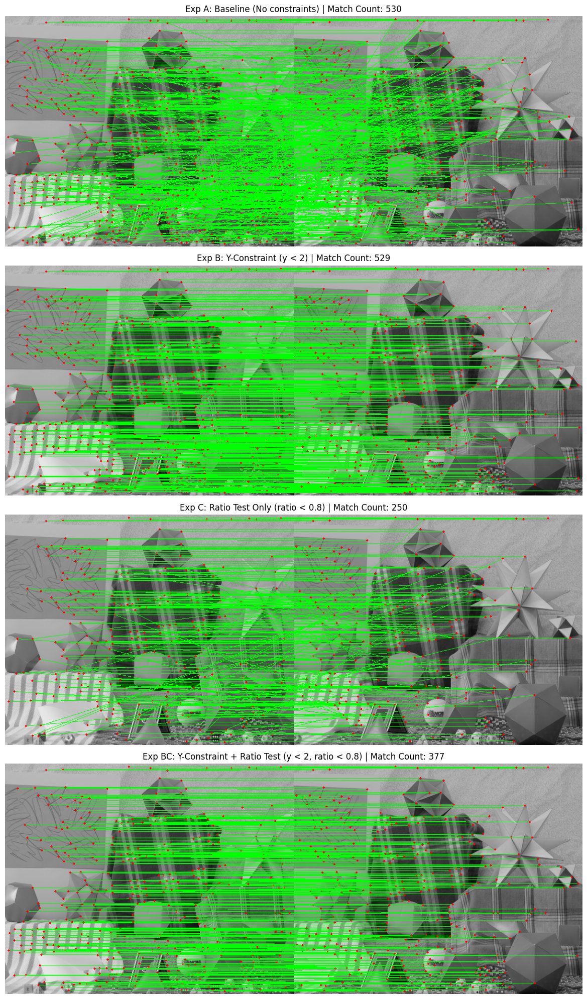

In [30]:
""" ------------- B2 Experiments ------------- """
"""
Chosen parameters
- Similarity Metric : NCC
- Descriptor        : patch_from_im
- Patch size        : 11 (small enough to capture local texture, large enough to have some uniqueness)
- y threshold       : 2 (already lots of matches with small threshold)
- ratio threshold   : 0.8 (standard value in literature, allows for some ambiguity but filters out many FPs)
"""

view0 = cv2.imread('images/view0.tif', cv2.IMREAD_GRAYSCALE)
view6 = cv2.imread('images/view6.tif', cv2.IMREAD_GRAYSCALE)
patch_size = 11
y_th = 2
ratio_th = 0.8

# exp 2A: baseline (2000 corners, no thresholds)
descriptor0_a, coords0_a = get_corner_descriptors_and_coords(img=view0, size=patch_size, max_corners=2000, descriptor_func=patch_from_im)
descriptor6_a, coords6_a = get_corner_descriptors_and_coords(img=view6, size=patch_size, max_corners=2000, descriptor_func=patch_from_im)
matches_a = find_matches(
    m1=descriptor0_a, 
    m2=descriptor6_a, 
    coords1=coords0_a, 
    coords2=coords6_a, 
    feature_comparison_func='NCC'
)
match_overlay_a = draw_matches(
    img1=view0, 
    img2=view6, 
    coords1=coords0_a, 
    coords2=coords6_a, 
    matches=matches_a
)

# exp 2B: Y-coord constraint (4000 corners, y_threshold=2)
descriptor0_b, coords0_b = get_corner_descriptors_and_coords(img=view0, size=patch_size, max_corners=4000, descriptor_func=patch_from_im)
descriptor6_b, coords6_b = get_corner_descriptors_and_coords(img=view6, size=patch_size, max_corners=4000, descriptor_func=patch_from_im)
matches_b = find_matches(
    m1=descriptor0_b, 
    m2=descriptor6_b, 
    coords1=coords0_b, 
    coords2=coords6_b, 
    feature_comparison_func='NCC', 
    y_threshold=y_th
)
match_overlay_b = draw_matches(
    img1=view0, 
    img2=view6, 
    coords1=coords0_b, 
    coords2=coords6_b, 
    matches=matches_b

)

# exp 2C: ratio (4000 corners, ratio_threshold=0.8)
matches_c = find_matches(
    m1=descriptor0_b, 
    m2=descriptor6_b, 
    coords1=coords0_b, 
    coords2=coords6_b, 
    feature_comparison_func='NCC', 
    ratio_threshold=ratio_th
)
match_overlay_c = draw_matches(
    img1=view0, 
    img2=view6, 
    coords1=coords0_b, 
    coords2=coords6_b, 
    matches=matches_c
)

# exp 2BC: Y-coord constraint + ratio (4000 corners, y_threshold=2, ratio_threshold=0.8)
matches_bc = find_matches(
    m1=descriptor0_b, 
    m2=descriptor6_b, 
    coords1=coords0_b, 
    coords2=coords6_b, 
    feature_comparison_func='NCC', 
    y_threshold=y_th, 
    ratio_threshold=ratio_th
)
match_overlay_bc = draw_matches(
    img1=view0, 
    img2=view6, 
    coords1=coords0_b, 
    coords2=coords6_b, 
    matches=matches_bc
)


# --- Display Results ---
fig, axes = plt.subplots(4, 1, figsize=(15, 20))

# exp A
axes[0].imshow(match_overlay_a)
axes[0].set_title(f"Exp A: Baseline (No constraints) | Match Count: {len(matches_a)}")
axes[0].axis('off')

# exp B
axes[1].imshow(match_overlay_b)
axes[1].set_title(f"Exp B: Y-Constraint (y < {y_th}) | Match Count: {len(matches_b)}")
axes[1].axis('off')

# exp C
axes[2].imshow(match_overlay_c)
axes[2].set_title(f"Exp C: Ratio Test Only (ratio < {ratio_th}) | Match Count: {len(matches_c)}")
axes[2].axis('off')

# exp BC
axes[3].imshow(match_overlay_bc)
axes[3].set_title(f"Exp BC: Y-Constraint + Ratio Test (y < {y_th}, ratio < {ratio_th}) | Match Count: {len(matches_bc)}")
axes[3].axis('off')

plt.tight_layout()
plt.show()

#### Tasks B3 - Exploring Descriptrs & Similarity Metrics

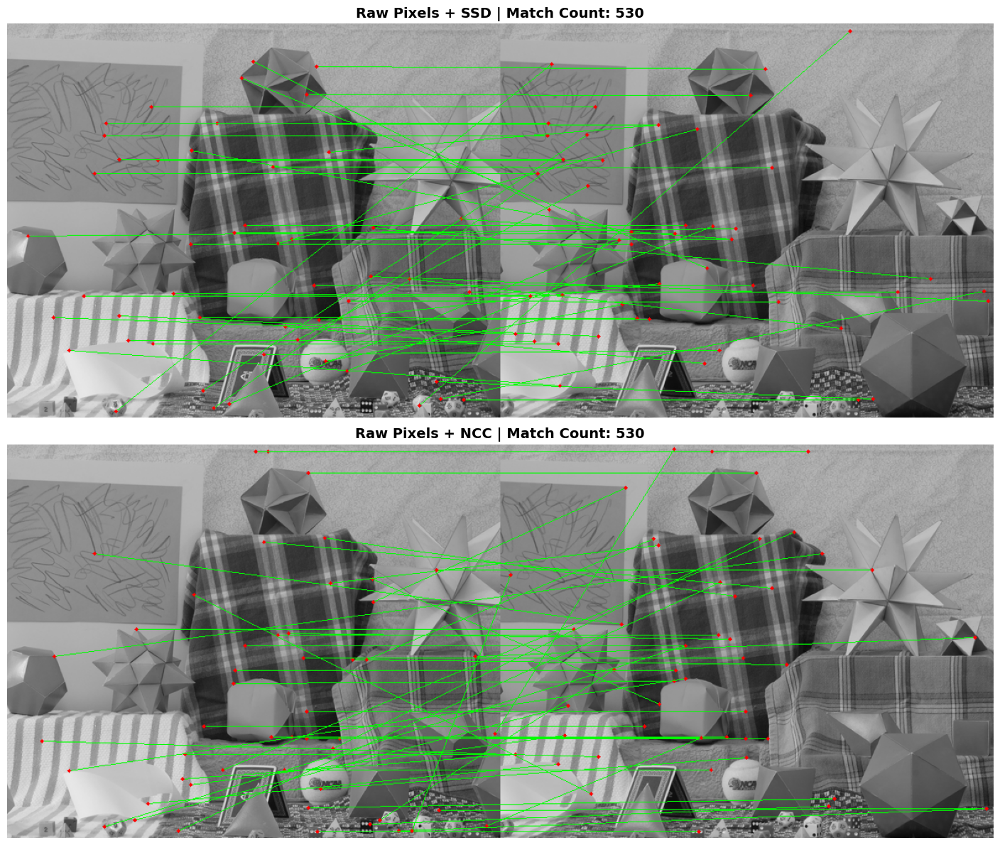

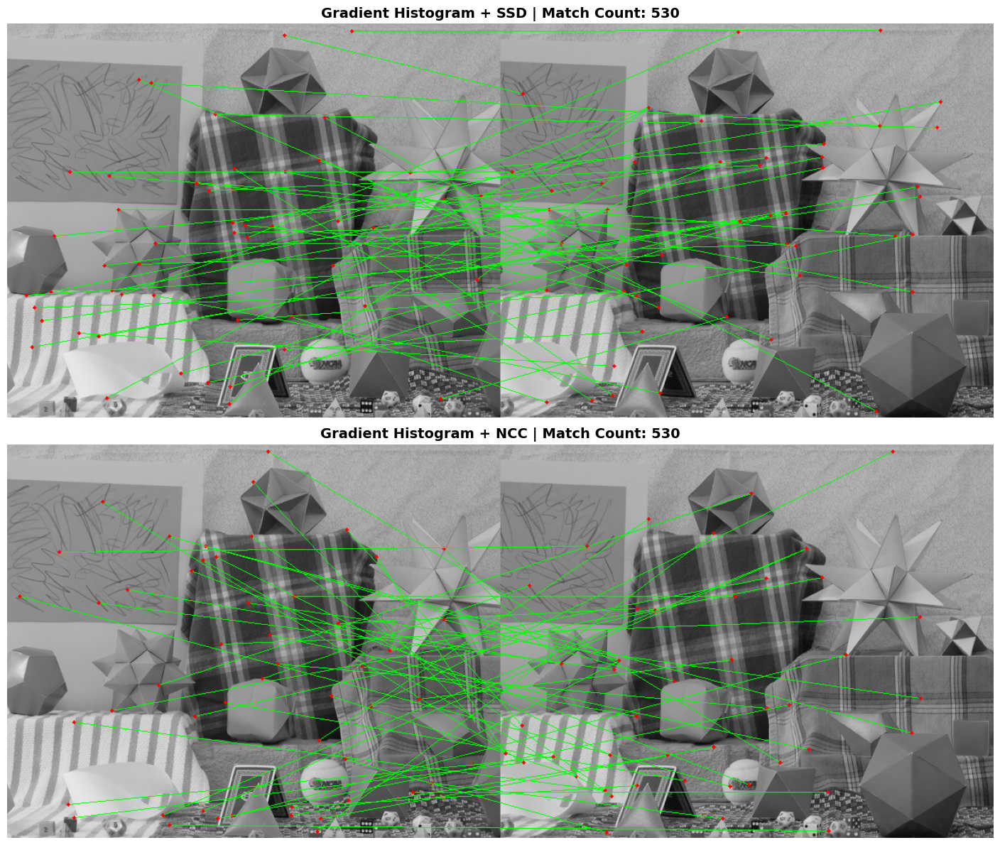

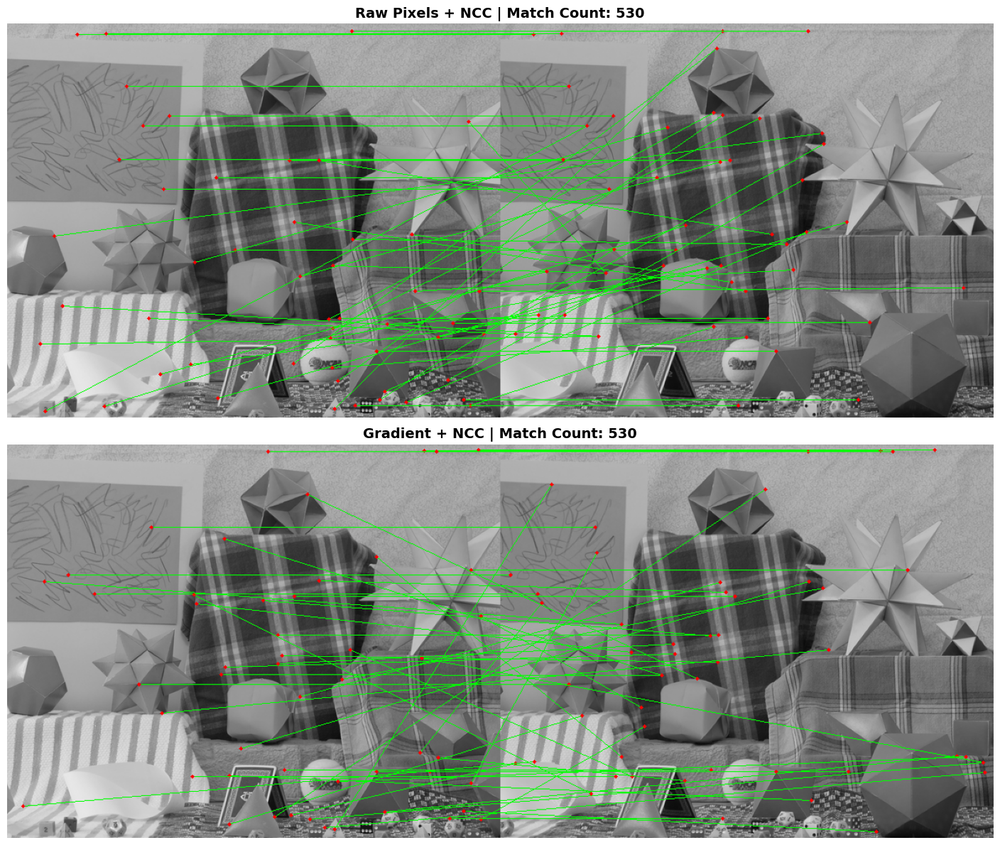

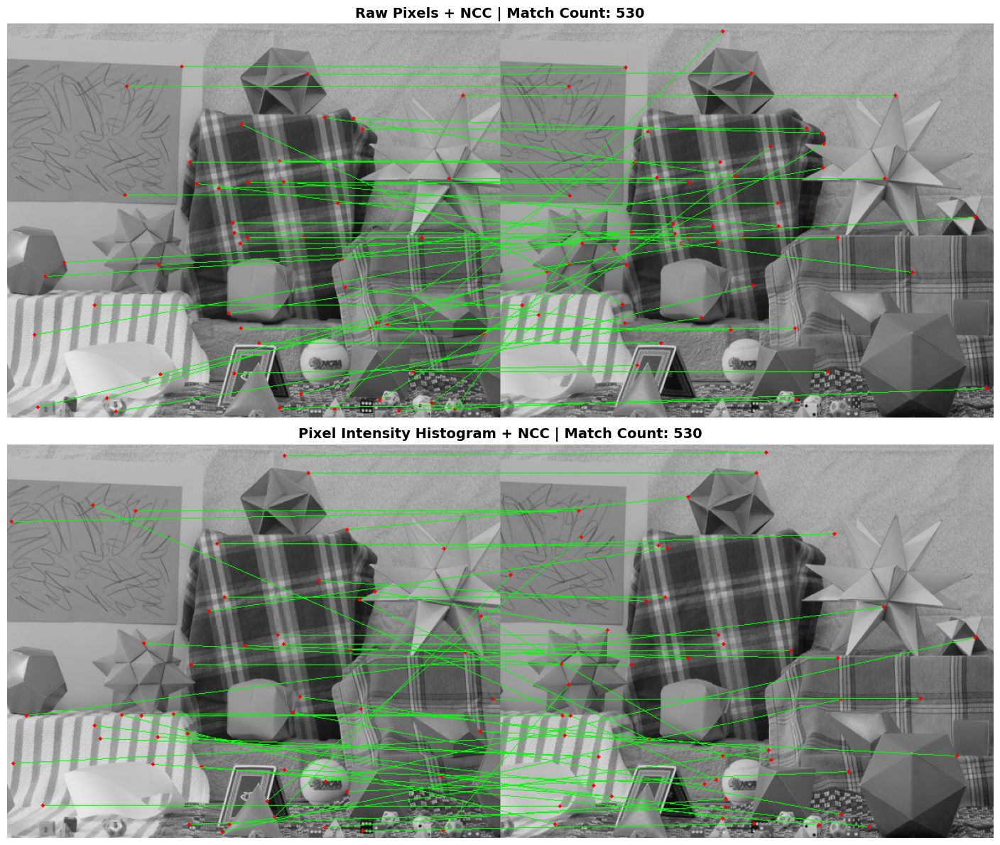

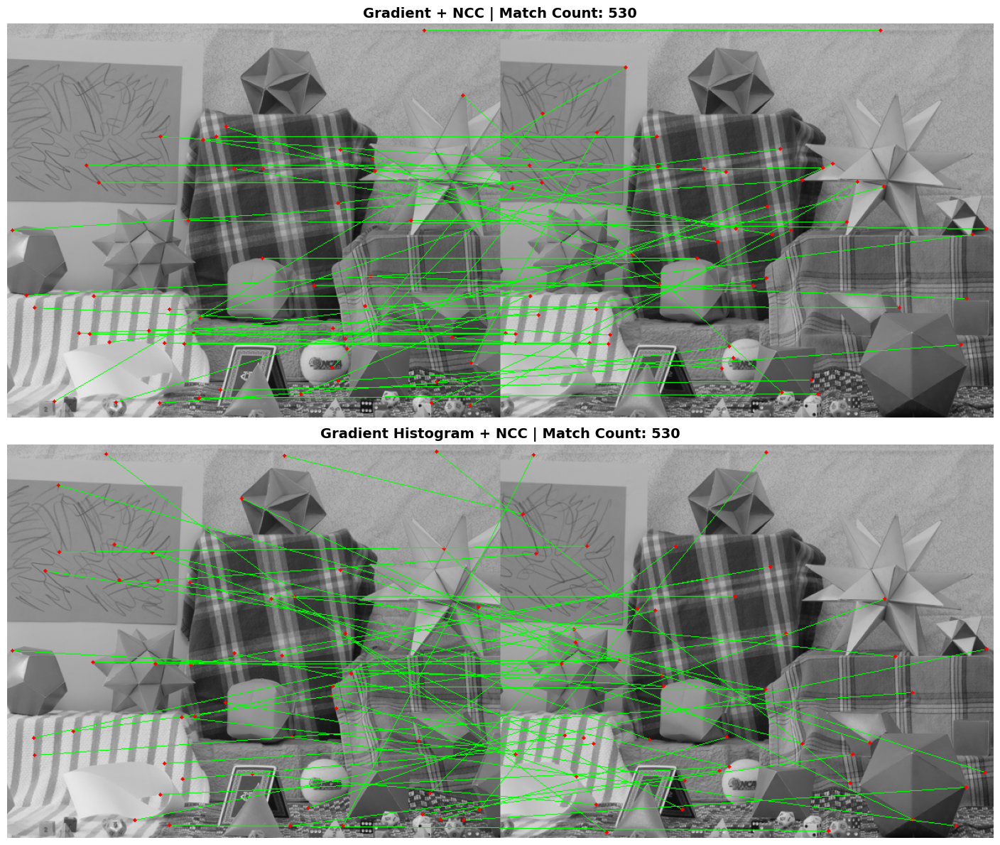

In [31]:
""" ------------- B3 Experiments ------------- """
import random

def compare_matching_configs(img1: np.ndarray, img2: np.ndarray, config1: dict, config2: dict, patch_size: int = 11, y_th: float = None, ratio_th: float = None) -> None:
    """
    Runs 2 matching configs + plots vertically
    Config structure: {'name': str, 'descr_func': function, 'metric': str}
    """
    num_corners = 1500

    fig, axes = plt.subplots(2, 1, figsize=(18, 12))
    
    for i, cfg in enumerate([config1, config2]):
        # extract corners
        d1, c1 = get_corner_descriptors_and_coords(img1, patch_size, num_corners, cfg['descr_func'])
        d2, c2 = get_corner_descriptors_and_coords(img2, patch_size, num_corners, cfg['descr_func'])
        
        # match
        matches = find_matches(
            m1=d1, 
            m2=d2, 
            coords1=c1, 
            coords2=c2, 
            feature_comparison_func=cfg['metric'], 
            y_threshold=y_th,
            ratio_threshold=ratio_th
        )
        match_samples = random.sample(matches, min(len(matches), 50))   # dont clog display
        overlay = draw_matches(img1=img1, img2=img2, coords1=c1, coords2=c2, matches=match_samples)
        
        # plot
        axes[i].imshow(overlay)
        axes[i].set_title(f"{cfg['name']} | Match Count: {len(matches)}", fontsize=14, fontweight='bold')
        axes[i].axis('off')
        
    plt.tight_layout()
    plt.show()


# --------------- Comparison 1: SSD vs NCC w/ pixels descriptor ---------------
compare_matching_configs(
    img1=view0, 
    img2=view6, 
    config1={'name': 'Raw Pixels + SSD', 'descr_func': patch_from_im, 'metric': 'SSD'},
    config2={'name': 'Raw Pixels + NCC', 'descr_func': patch_from_im, 'metric': 'NCC'}
)

# --------------- Comparison 2: SSD vs NCC w/ histogram descriptor ---------------
compare_matching_configs(
    img1=view0, 
    img2=view6, 
    config1={'name': 'Gradient Histogram + SSD', 'descr_func': hist_gradient, 'metric': 'SSD'},
    config2={'name': 'Gradient Histogram + NCC', 'descr_func': hist_gradient, 'metric': 'NCC'}
)

# --------------- Comparison 3: Pixels vs Gradients ---------------
compare_matching_configs(
    img1=view0, 
    img2=view6, 
    config1={'name': 'Raw Pixels + NCC', 'descr_func': patch_from_im, 'metric': 'NCC'},
    config2={'name': 'Gradient + NCC',   'descr_func': gradient,      'metric': 'NCC'}
)

# --------------- Comparison 4: Spatial vs Histogram (Intensity) ---------------
compare_matching_configs(
    img1=view0, 
    img2=view6, 
    config1={'name': 'Raw Pixels + NCC',                'descr_func': patch_from_im, 'metric': 'NCC'},
    config2={'name': 'Pixel Intensity Histogram + NCC', 'descr_func': hist_patch_im, 'metric': 'NCC'}
)

# --------------- Comparison 5: Gradient vs Gradient Histogram ---------------
compare_matching_configs(
    img1=view0, 
    img2=view6, 
    config1={'name': 'Gradient + NCC',           'descr_func': gradient,      'metric': 'NCC'},
    config2={'name': 'Gradient Histogram + NCC', 'descr_func': hist_gradient, 'metric': 'NCC'}
)


**Apply and answer**
   
1. Compute the corners in a pair of images (e.g., `images/view0.tif` and `images/view6.tif`).
2. Experiment with 3 ways to perform the matching:
   1. Choose up to 2000 of the strongest corners (you can use fewer) and find a matching between the corners in the pair of images.
      - Choose a fixed scale and use it to define a patch around each corner.
      - To display the matching, use the function `cv2.hconcat([im1, im2])`, which concatenates two images horizontally, and then draw lines as described in the previous section.
   2. Use up to 4000 of the strongest corners (you can use fewer) in each image and use the matching only between corners that have approximately the same y-coordinate (up to a threshold). The `images` folder contains pairs of rectified images.
   3. Use the ratio between the best and second best matches to find good matches.
      - You can use NCC or SSD on the desriptor of your choice.
      - You can either apply or not apply the $y$-coordinate constraint (B).
      - **Present** examples that demonstrate the effectiveness of using the ratio.
3. Study the differences between the various descriptors and also the use of SSD or NCC. 
   - **Present**  examples that demonstrate your findings.
4. Identify incorrect pairs of matched points.
   **Mark and display** for cases (A), (B), and (C) a pair of incorrectly matched points.
   **Answer:**
   - In which of the 3 cases are there more incorrect matches?
   - What may be the reason for the incorrect matches?
5. In which regions of the scene were most of the reliable matches found?


In [32]:
# Section B - Apply and answer (student code)
# TODO: student implementation

match_overlay = match_overlay_a    # color image showing matches (no y-constraint)
match_overlay_y = match_overlay_b  # color image showing matches (with y-constraint)
matching_analysis = """
Similarty metrics comparison: NCC is significantly more robust than SSD.\n
view0 is slight brighter than view6, and SSD's absolute distance calculation seems to cause diagonal FP's (vertical disparity). \n
NCC normalizes for local mean and variance, which seems to isolate the texture from the intensity comparison.\n\n

Descriptors: there seems to be a trade-off between detection and position precision. While Histograms (both pixel values and gradient) are less sensitive to noise, \n
they seem to cause spatial positioning to shoft; without the 'safety net' of Y-threshold, they frequently match distant, unrelated patches that happen to share a similar \n
distribution patterns. The combination of NCC with a the gradient descriptor seems to give the best results - fewer FP's and precise posistioning of matched features.
"""
reliable_match_regions = """
It seems that good matches are concentrated in high-contrast structural landmarks, like the sharp vertices of the origami pieces or the sketch. \n
These regions provide unique gradient patterns that allow the ratio condition to distinguish the best match from the second-best.
"""

**Implementation details**

You can compute the NCC or SSD patch by patch. This will probably take longer than using matrix multiplications via NumPy.

Using matrices:
1. Generate a 1D vector from each descriptor.
2. Generate a matrix $M_1$:  rows  are  the descriptors of img1.
3. Generate a matrix $M_2$:  columns  are  the descriptors of img2.
4. Use `M = np.matmul(M_1,M_2)` or the shorthand `M = M_1 @ M_2` to multiple the matrices.
   * what is the value in $M(i,j)$?
5. Think of how to normalize `M` for NCC calculation, and how to use `M` for SSD calculation. \
Hint: consider the formula for $(a-b)^2$.
    
You can change the functions `SSD()` and `NCC()` above to use your vectorized implementation (i.e., their inputs should be matrices instead of vectors, where each column is one descriptor).

## <span style="color:blue">Section C: Extracting 3D Structure</span>

In this part you will compute the 3D structure from a pair of rectified images.


**Input:**
1. A pair of two rectified images, $im1$ and $im2$ (e.g., `images/view1.tif` and `images/view5.tif`).
2. A window size $(s_x,s_y$).
3. Disparity range $(d_{min},d_{max})$ (see below).

**Output:**
1. A matrix, $D$ with the disparity map for the left image.
2. Three matrices X, Y, Z with the x, y, z-coordinates of each pixel in the left image. Assign zero for pixels for which the disparity was not computed.

Note: all matrices $im1, im2, D, X, Y, Z$ have the same dimensions.

**Instructions:**
1. Your code should assume a pair of rectified images as input. You can use `images/view1.tif` and `images/view5.tif`.
2. Write a function that receives two rectified images, and computes dense matching along lines with the same $y$-coordinate.
    * You can use any of the descriptors from Part B. The patch size should be given as a parameter.
    * Use NCC for the similarity measure.
    * You can assume that you are given the range of disparities, $d_{min},d_{max}$ as an input. \
      For example, if  $(d_{min},d_{max})=(20,120)$ it follows that the corresponding point of  $(x,y)$ in the left image, is in the range $(x-120:x-20,y)$ in the right image.
    * Consider matching with and without order preserving. 
    * List all parameters you use for your function.
    * Hints on efficient implementation are given below.
3. Write a function that computes the disparity based on (2).  
    * **Display** the disparity $D$ map as an image
4. Compute the depth map using the disparity.
    * Assume that scaled focal lengths are $α_x=α_y=1$.
    * The distance between the cameras is 160mm.
    * Add to your disparity depth map the value 100, since images were cropped. 
    * Display the disparity as an image. 
5. Compute the matrices X,Y,Z
    * Present the object given by X,Y,Z using a 3D plot.


**Implementation**\
You can implement the computation of the similarity and the disparity directly by an exhaustive search. You can also use the idea from Part B. A more efficeint and elegant way is described below. You are welcome to try, but you do not have to.


General idea for the **vectorized solution** (you will need to fill in the gaps):
* Let $w$ and $h$ be the width and the height of the image respectively.
* First assume that the patch size is $1\times s_y$.
* Given two $1\times w$ rows, $r_1$ and $r_2$ which are corresponding rows of the two images. Compute the $w\times w$ matrix $R12=r_1^T r_2$. The values $R12(i,j)$ consists of the product of two pixels $r_1(i)\cdot r_2(j)$.
* Find a matrix that, when convolved with $R12$, will produce the correlation of the $s_y$ 1D neighborhood of $r_1(i)$ and $r_2(j)$.
* Think about how to normalize this correlation using the same ideas as in the previous section.
* Extend your solution to work for a general patch size $s_x\times s_y$. Hint: $R$ and the convolution kernels are no longer 2D matrices.
* Up to here, we considered each row seperately, hence we need to loop over all rows of the images. There is a way to do it without looping, but not in this assignemnt :)


In [36]:
# Section C implementation area (student code)
# TODO: student implementation

###############################################################################
# IMPORTANT – Final variables for the Results Display cell.
# Define ALL of these somewhere in your notebook before running the last cell.
#
# Section A:
#   lines_on_sudoku_overlay  – colour image (H x W x 3) of Sudoku with detected lines drawn in red
#   resolution_effect        – string: how r and theta resolution affect results
#   line_length_algorithm    – string: algorithm to compute line length
#   line_detection_applications – list of 3 strings
#
# Section B:
#   match_overlay            – colour image (H x (W1+W2) x 3) showing matches between view0 & view6
#   match_overlay_y          – same as above but with y-coordinate constraint
#   matching_analysis        – string: analysis of incorrect matches
#   reliable_match_regions   – string: where reliable matches are found
#
# Section C:
#   disparity_map            – 2D array (H x W) disparity values
#   depth_map                – 2D array (H x W) depth values
###############################################################################

## Simple Submission Flow

1. Implement your code in Section A, Section B, and Section C cells.
2. Define the final variables listed below.
3. Run `Results Display` (last cell).
4. Submit this notebook (results are displayed at the end).

## Final Variables to Display

Define these variables in your notebook code. The last cell reads them directly.

**Section A – Hough Transform:**
- `lines_on_sudoku_overlay` – colour image (H x W x 3) of Sudoku with detected lines drawn in red
- `resolution_effect` (short text - answer to Q3)
- `line_length_algorithm` (short text - answer to Q5)
- `line_detection_applications` (list of 3 strings - answer to Q6)

**Section B – Patch Matching:**
- `match_overlay` – colour image showing matches between view0 & view6 (no y-constraint)
- `match_overlay_y` – colour image showing matches with y-coordinate constraint
- `matching_analysis` (short text - answer to Q4)
- `reliable_match_regions` (short text - answer to Q5)

**Section C – Stereo Depth:**
- `disparity_map` (2D array)
- `depth_map` (2D array)

## Final Results Display

Section A - Hough Transform
  lines_on_synthetic_overlay: shape=(200, 200, 3), dtype=uint8


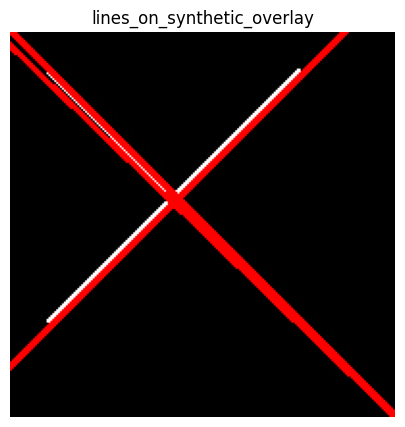

  lines_on_sudoku_overlay: shape=(1053, 1053, 3), dtype=uint8


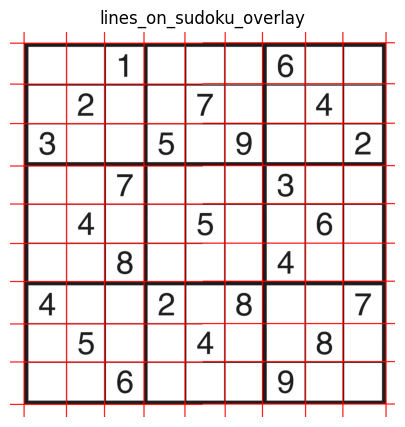

  resolution_effect: 
The resolutions of r and theta dictate the size of the Hough bins, controlling tolerance for 
variations in position and angle.



Fine resolution on both:

- requires points to fall within a very narrow/limited "strip" of lines

- can distinguish closely spaced lines if they are well defined

- struggles with thick or noisy lines (see double-detetions in crosswalk image) -> votes from 
single thick edge fall into multiple adjacent bins, leading to: a) multiple detections of same 
real edge and b) missed detections if bins fall short of vote threshold



Coarse r resolution:

- reduces line position strictness - edge points falling on parallel lines within the broader range of r are grouped

- groups distant, unrelated pixels into the same bin because they share an angle -> creates FP lines

- makes TP physically shift away from their real edges



Coarse theta resolution:

* reduces angle strictness - points sitting on lines with similar but not identical angles 

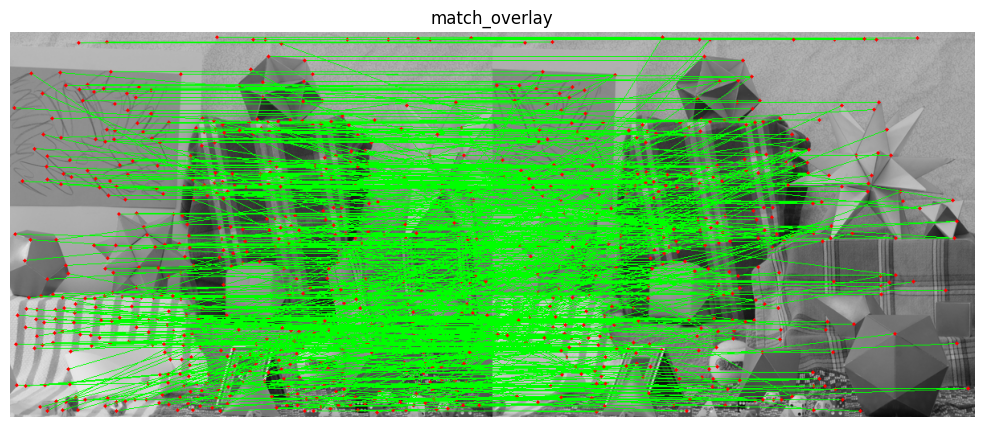

  match_overlay_y: shape=(479, 1200, 3), dtype=uint8


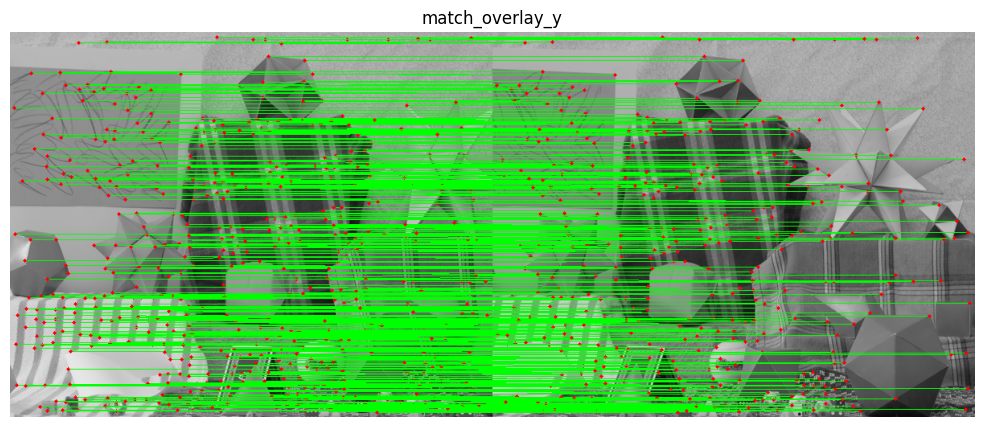

  matching_analysis: 
Similarty metrics comparison: NCC is significantly more robust than SSD.

view0 is slight brighter than view6, and SSD's absolute distance calculation seems to cause diagonal FP's (vertical disparity). 

NCC normalizes for local mean and variance, which seems to isolate the texture from the intensity comparison.



Descriptors: there seems to be a trade-off between detection and position precision. While Histograms (both pixel values and gradient) are less sensitive to noise, 

they seem to cause spatial positioning to shoft; without the 'safety net' of Y-threshold, they frequently match distant, unrelated patches that happen to share a similar 

distribution patterns. The combination of NCC with a the gradient descriptor seems to give the best results - fewer FP's and precise posistioning of matched features.

  reliable_match_regions: 
It seems that good matches are concentrated in high-contrast structural landmarks, like the sharp vertices of the origami pieces

In [37]:
import numpy as np
import matplotlib.pyplot as plt


def _show_text(name, value):
    if value is None:
        print(f"  {name}: MISSING")
    else:
        print(f"  {name}: {value}")


def _show_image(name, value, figsize=(6, 5)):
    if value is None:
        print(f"  {name}: MISSING")
        return
    arr = np.asarray(value)
    print(f"  {name}: shape={arr.shape}, dtype={arr.dtype}")
    plt.figure(figsize=figsize)
    if arr.ndim == 2:
        plt.imshow(arr, cmap="gray")
    else:
        plt.imshow(arr)
    plt.title(name)
    plt.axis("off")
    plt.show()


# ==================== Section A ====================
print("=" * 60)
print("Section A - Hough Transform")
print("=" * 60)
_show_image("lines_on_synthetic_overlay",
            globals().get("lines_on_synthetic_overlay", None))
_show_image("lines_on_sudoku_overlay",
            globals().get("lines_on_sudoku_overlay", None))
_show_text("resolution_effect",
           globals().get("resolution_effect", None))
_show_text("# of lines with at least 50 points",
           globals().get("num_lines_vote_threshold_50", None))
_show_text("line_length_algorithm",
           globals().get("line_length_algorithm", None))
_show_text("line_detection_applications",
           globals().get("line_detection_applications", None))

# # ==================== Section B ====================
print("\n" + "=" * 60)
print("Section B - Patch Matching")
print("=" * 60)
_show_image("match_overlay",
            globals().get("match_overlay", None), figsize=(14, 5))
_show_image("match_overlay_y",
            globals().get("match_overlay_y", None), figsize=(14, 5))
_show_text("matching_analysis",
           globals().get("matching_analysis", None))
_show_text("reliable_match_regions",
           globals().get("reliable_match_regions", None))

# # ==================== Section C ====================
# print("\n" + "=" * 60)
# print("Section C - Depth from Stereo")
# print("=" * 60)
# disp = globals().get("disparity_map", None)
# depth = globals().get("depth_map", None)
# if disp is not None:
#     arr = np.asarray(disp)
#     print(f"  disparity_map: shape={arr.shape}, dtype={arr.dtype}, "
#           f"min={arr.min():.1f}, max={arr.max():.1f}")
#     plt.figure(figsize=(8, 5))
#     plt.imshow(arr, cmap="jet"); plt.colorbar(label="disparity")
#     plt.title("disparity_map"); plt.axis("off"); plt.show()
# else:
#     print("  disparity_map: MISSING")
# if depth is not None:
#     arr = np.asarray(depth)
#     print(f"  depth_map: shape={arr.shape}, dtype={arr.dtype}, "
#           f"min={arr.min():.1f}, max={arr.max():.1f}")
#     plt.figure(figsize=(8, 5))
#     plt.imshow(arr, cmap="jet"); plt.colorbar(label="depth (mm)")
#     plt.title("depth_map"); plt.axis("off"); plt.show()
# else:
#     print("  depth_map: MISSING")